In [10]:
import matplotlib.pyplot as plt
import pandas as pd

In [11]:
tot = 0
combinations = {}
for chunk in pd.read_hdf('../data/results_combined/merged_with_dr14/df_lc.h5', chunksize=2e7):
    tot+=2e7
    print(tot)
    gb = chunk.groupby(['runid','label'])
    for (label, runid), i in gb.groups.items():
        if (label, runid) in combinations:
            combinations[(label, runid)] = (combinations[(label, runid)][0], i[-1])
        else:
            combinations[(label, runid)] = (i[0], i[-1])
            
df_start_stop = pd.DataFrame.from_dict(combinations, orient='index', columns=['start', 'stop'])
df_start_stop = df_start_stop.sort_values('start')
df_start_stop.to_csv('../data/results_combined/merged_with_dr14/df_lc_indexs.csv')
df_start_stop


20000000.0
40000000.0
60000000.0
80000000.0
100000000.0
120000000.0
140000000.0
160000000.0
180000000.0
200000000.0
220000000.0
240000000.0
260000000.0
280000000.0
300000000.0


,start,stop
"(0911990501_0_5_0.2_2.0, 1)",0,24694
"(0911990501_0_5_0.2_2.0, 0)",24695,49389
"(0911990501_0_5_0.2_2.0, 2)",49390,74084
"(0911990501_0_5_0.2_2.0, 3)",74085,98779
"(0911990501_0_5_0.2_2.0, 5)",98780,123474
...,...,...
"(0932391001_0_200_0.2_12.0, 1)",294837772,294837992
"(0932391001_0_200_0.2_12.0, 0)",294837993,294838213
"(0932391001_0_200_0.2_12.0, 2)",294838214,294838434
"(0932391001_0_200_0.2_12.0, 3)",294838435,294838655


In [19]:
df_start_stop = pd.read_csv('../data/results_combined/merged_with_dr14/df_lc_indexs.csv', index_col='Unnamed: 0')

In [38]:
df_start_stop = df_start_stop[df_start_stop.index.str.contains('_5_2.0_12.0')]

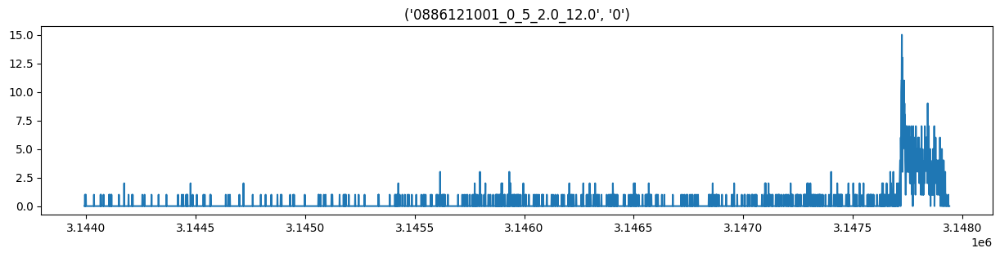

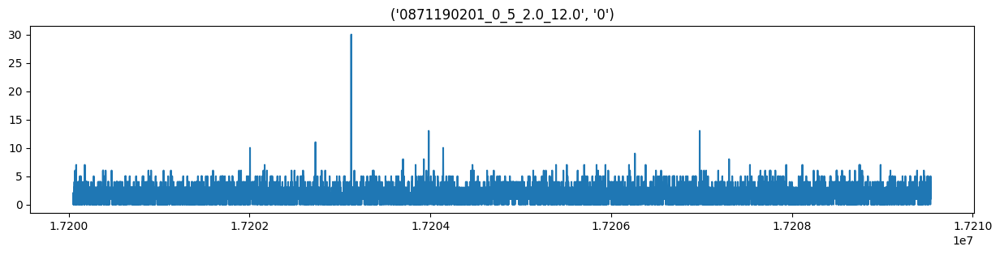

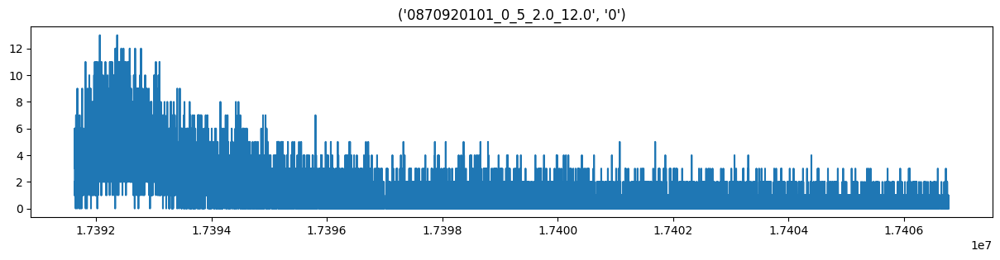

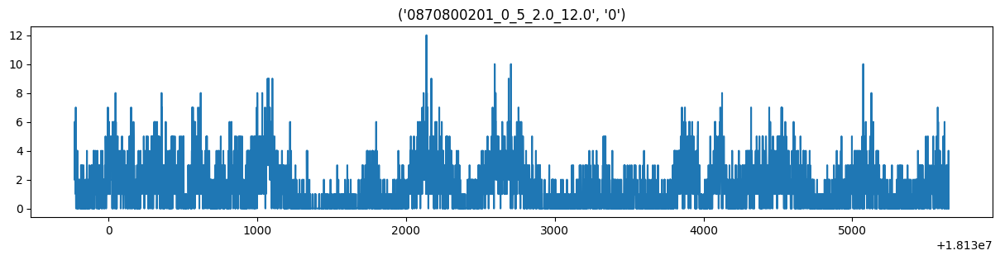

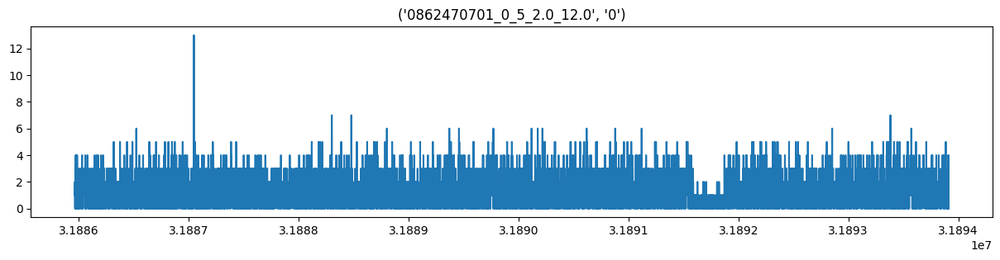

...

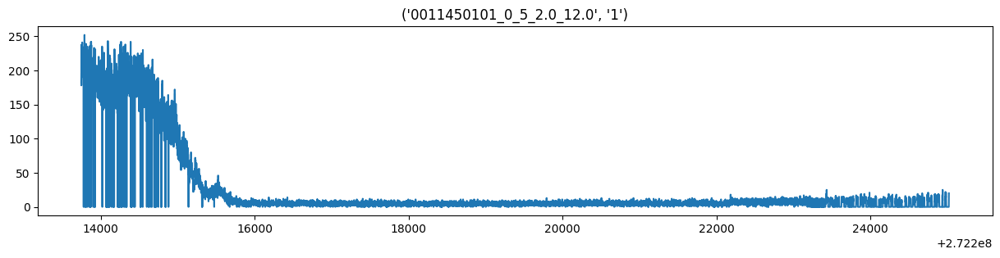

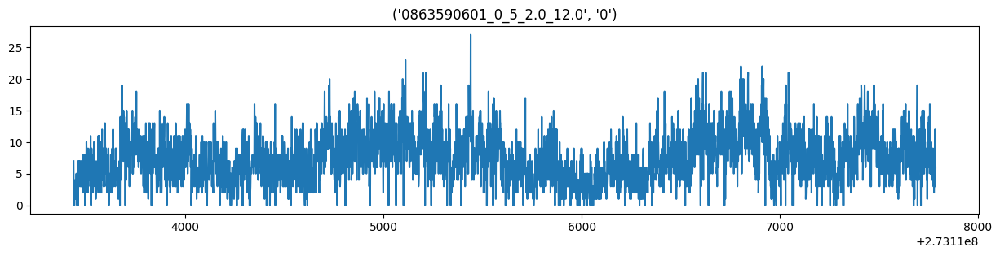

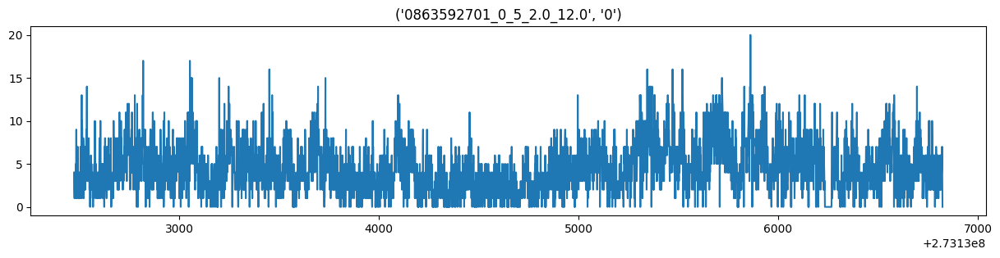

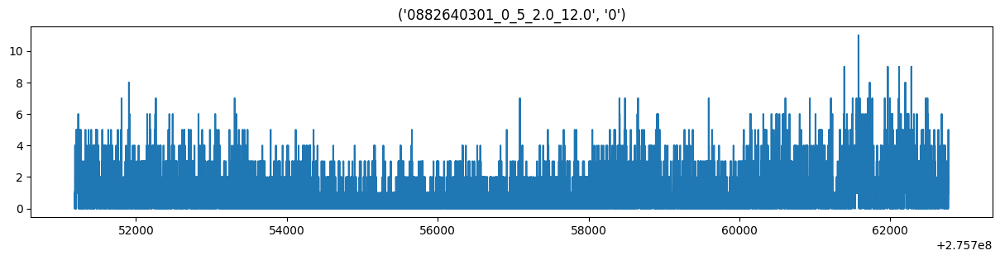

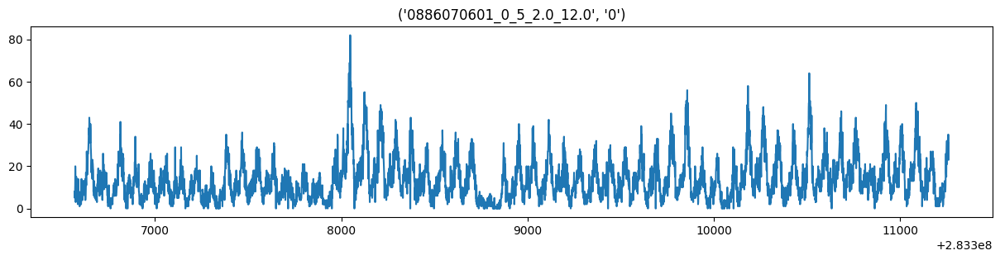

In [39]:
from tqdm import tqdm
import matplotlib.pyplot as plt


for i, r in df_start_stop.iterrows():
    df_lc = pd.read_hdf('../data/results_combined/merged_with_dr14/df_lc.h5', start=r['start'], stop=r['stop'])
    if df_lc['n'].max() > 10:
        plt.figure(figsize=(15,3))
        plt.title(i)
        plt.plot(df_lc['n'])
        plt.show()
        